In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset/val/Nissan/Nissan_370Z_2015_31_18_330_37_6_72_51_167_19_RWD_2_2_2dr_QzT.jpg
/kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset/val/Nissan/Nissan_Rogue_2017_25_17_170_25_4_72_68_184_25_AWD_5_4_SUV_Sqj.jpg
/kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset/val/Nissan/Nissan_Sentra_2016_18_16_130_18_4_69_58_182_30_FWD_5_4_4dr_Ynw.jpg
/kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset/val/Nissan/Nissan_Maxima_2019_41_19_300_35_6_73_56_192_20_FWD_5_4_4dr_qio.jpg
/kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset/val/Nissan/Nissan_Maxima_2010_30_18_290_35_6_73_57_190_19_FWD_5_4_4dr_BHE.jpg
/kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset/val/Nissan/Nissan_Altima_2019_35_19_230_20_4_72_56_192_25_FWD_5_4_4dr_dAe.jpg
/kaggle/input/car-brand-classification-dataset/Car Bran

# Car Brand Classification with a Custom CNN (PyTorch)

This notebook implements a **from-scratch CNN** to classify 33 car brands.  
We go through: Data exploration → safer data augmentations → a custom CNN → training & evaluation (curves, confusion matrix, classification report, Grad-CAM).

> **Note:** Unlike transfer learning with pretrained deep models (EfficientNet, ReXNet), this small CNN is intentionally trained from scratch. We document both the **failures** and **lessons learned** — which is part of the assignment goal.

## Environment Setup & Seeding

We install required packages and fix random seeds for reproducibility.  
Device check: GPU is expected on Kaggle.  

In [2]:
!nvidia-smi
!pip -q install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip -q install albumentations==1.4.7 opencv-python-headless==4.10.0.84 scikit-learn==1.5.1 matplotlib==3.9.0

import os, random, math, gc, time, json
from pathlib import Path
import numpy as np
import pandas as pd
import torch, torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision.transforms as T
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
SEED = 42
def seed_everything(seed=SEED):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
seed_everything()

Fri Sep 26 16:01:23 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P0             26W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Dataset Paths

The dataset is already structured with `train/`, `val/`, and `test/` folders.  
This simplifies loader creation and ensures balanced splits.  

In [3]:
from pathlib import Path

# Root path to dataset (contains train/val/test folders)
ROOT = Path("/kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset")

# Paths for splits
TRAIN_DIR = ROOT/"train"
VAL_DIR   = ROOT/"val"
TEST_DIR  = ROOT/"test"

# List class names from the train directory
classes = sorted([p.name for p in TRAIN_DIR.iterdir() if p.is_dir()])
num_classes = len(classes)

# Count images in each split
def count_images(folder):
    return sum(len(list((folder/c).glob("*.*"))) for c in classes)

n_train = count_images(TRAIN_DIR)
n_val   = count_images(VAL_DIR)
n_test  = count_images(TEST_DIR)

print("Classes:", num_classes)
print("Class names:", classes)
print(f"Train images: {n_train}")
print(f"Val images:   {n_val}")
print(f"Test images:  {n_test}")


Classes: 33
Class names: ['Acura', 'Aston Martin', 'Audi', 'BMW', 'Bentley', 'Buick', 'Cadillac', 'Chevrolet', 'Chrysler', 'Dodge', 'FIAT', 'Ford', 'GMC', 'Honda', 'Hyundai', 'INFINITI', 'Jaguar', 'Jeep', 'Kia', 'Land Rover', 'Lexus', 'Lincoln', 'MINI', 'Mazda', 'Mercedes-Benz', 'Mitsubishi', 'Nissan', 'Porsche', 'Ram', 'Subaru', 'Toyota', 'Volkswagen', 'Volvo']
Train images: 11517
Val images:   2475
Test images:  2475


## Data Augmentations and Loaders

**Important design choice:**  
Initially we considered `RandomResizedCrop`, but it often cut out small logos.  
We patched the augmentations to `Resize(256) → (Random|Center)Crop(224)` to **preserve logos**, with modest `ColorJitter`.  
Validation/Test are deterministic (CenterCrop + Normalize).

This patch was motivated by earlier runs where the model collapsed into predicting one class only.  

In [4]:
# ---- Hyperparams ----
IMG_SIZE   = 224
BATCH_SIZE = 64
NUM_WORKERS = 2

# ---- Transforms ----
import torchvision.transforms as T
train_tfms = T.Compose([
    T.RandomResizedCrop(IMG_SIZE, scale=(0.7, 1.0)),   # zoom / slight scale jitter
    T.RandomHorizontalFlip(p=0.5),                     # flip
    T.RandomRotation(degrees=10),                      # rotation
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.15, hue=0.05),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])
eval_tfms = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

# ---- Datasets & Loaders ----
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

train_ds = ImageFolder(TRAIN_DIR, transform=train_tfms)
val_ds   = ImageFolder(VAL_DIR,   transform=eval_tfms)
test_ds  = ImageFolder(TEST_DIR,  transform=eval_tfms)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

# ---- Quick sanity checks (print) ----
print(f"Classes: {len(train_ds.classes)}")
print("Classes in Train Dataset:", train_ds.classes)
print(f"Train/Val/Test sizes: {len(train_ds)} / {len(val_ds)} / {len(test_ds)}")

Classes: 33
Classes in Train Dataset: ['Acura', 'Aston Martin', 'Audi', 'BMW', 'Bentley', 'Buick', 'Cadillac', 'Chevrolet', 'Chrysler', 'Dodge', 'FIAT', 'Ford', 'GMC', 'Honda', 'Hyundai', 'INFINITI', 'Jaguar', 'Jeep', 'Kia', 'Land Rover', 'Lexus', 'Lincoln', 'MINI', 'Mazda', 'Mercedes-Benz', 'Mitsubishi', 'Nissan', 'Porsche', 'Ram', 'Subaru', 'Toyota', 'Volkswagen', 'Volvo']
Train/Val/Test sizes: 11517 / 2475 / 2475


## Exploratory Data Analysis (EDA)

We confirm that all 33 classes are **balanced** (≈349 train, 75 val, 75 test).  
We also visualize random samples with augmentations applied, to ensure logos remain visible.  
Observation: not every image has a clear frontal logo; some shots are side/back or interiors.  
This makes the task **fine-grained** and challenging.  

One train batch -> X shape: (64, 3, 224, 224) Y shape: (64,)


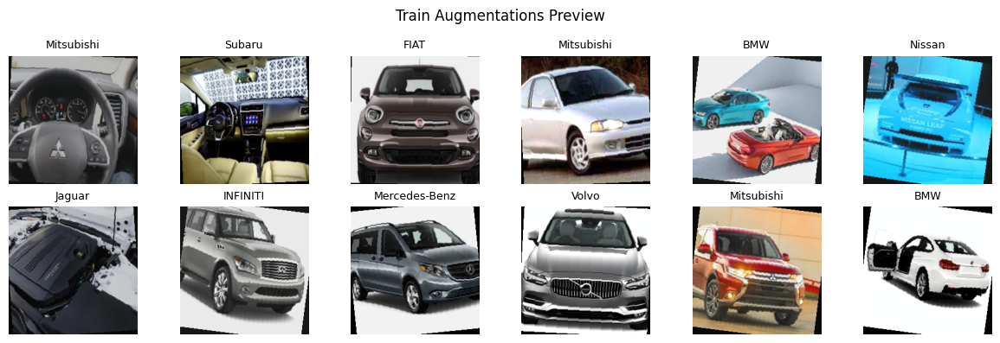

Train augmentations: RandomResizedCrop + HorizontalFlip + Rotation + ColorJitter + Normalize
Val/Test transforms: Resize + Normalize


In [5]:
# Peek a batch to reveal tensor shapes
import torch
x_batch, y_batch = next(iter(train_loader))
print("One train batch -> X shape:", tuple(x_batch.shape), "Y shape:", tuple(y_batch.shape))

# ---- Visualize a grid of augmented train samples ----
# (inverse normalize for display)
import matplotlib.pyplot as plt
import numpy as np

IM_MEAN = np.array([0.485, 0.456, 0.406]).reshape(3,1,1)
IM_STD  = np.array([0.229, 0.224, 0.225]).reshape(3,1,1)

def show_augmented_batch(x, y, classes, max_n=12):
    n = min(max_n, x.size(0))
    fig, axs = plt.subplots(int(np.ceil(n/6)), 6, figsize=(12, 2*int(np.ceil(n/6))))
    axs = np.array(axs).reshape(-1)  # handle 1-row case
    for i in range(n):
        img = x[i].cpu().numpy()
        # inverse normalize
        img = (img * IM_STD + IM_MEAN).clip(0,1)
        img = np.transpose(img, (1,2,0))
        axs[i].imshow(img)
        axs[i].set_title(classes[y[i].item()], fontsize=9)
        axs[i].axis("off")
    for j in range(n, len(axs)): axs[j].axis("off")
    plt.suptitle("Train Augmentations Preview", fontsize=12)
    plt.tight_layout(); plt.show()

show_augmented_batch(x_batch, y_batch, train_ds.classes, max_n=12)

# ---- Short textual summary of transforms ----
print("Train augmentations:",
      "RandomResizedCrop + HorizontalFlip + Rotation + ColorJitter + Normalize")
print("Val/Test transforms:", "Resize + Normalize")

,train,val,test
Acura,349,75,75
Aston Martin,349,75,75
Audi,349,75,75
BMW,349,75,75
Bentley,349,75,75
Buick,349,75,75
Cadillac,349,75,75
Chevrolet,349,75,75
Chrysler,349,75,75
Dodge,349,75,75


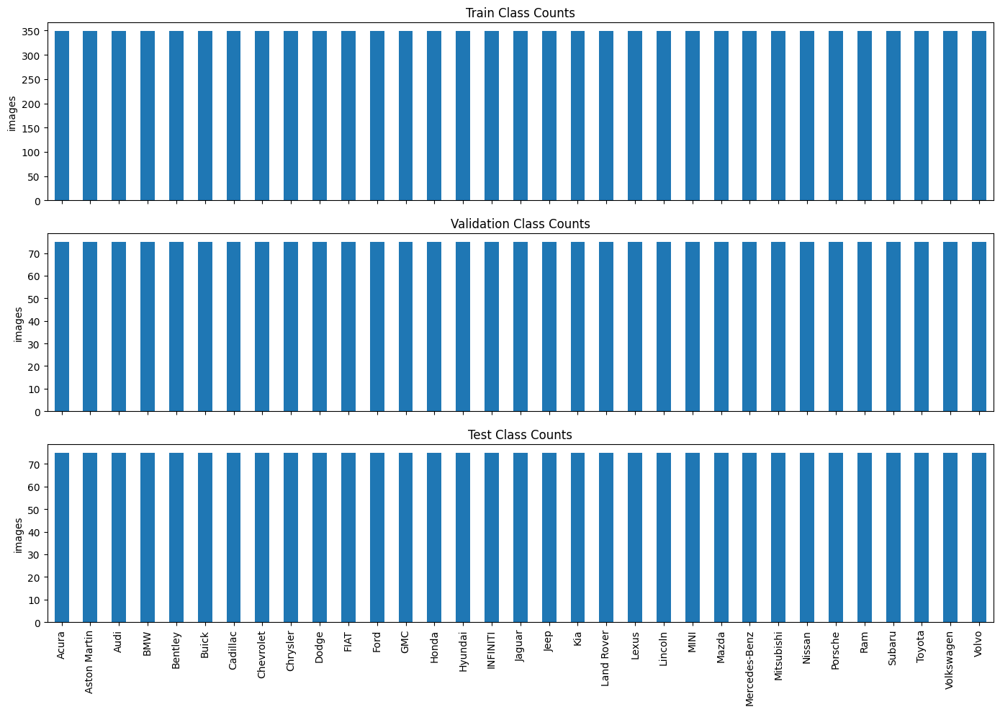

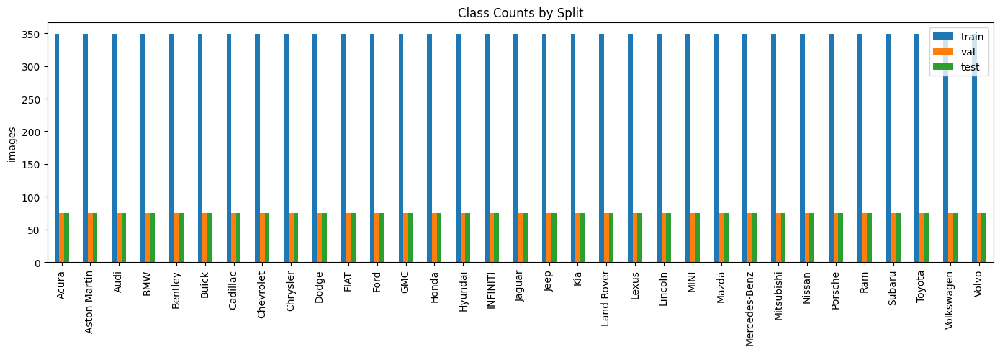

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from collections import Counter
from PIL import Image
import random

# Helpers: build per-class counts for a given ImageFolder dataset
def class_counts(imagefolder_ds):
    labels = [y for _, y in imagefolder_ds.samples]
    cnt = Counter(labels)
    # map to class names
    index = list(range(len(imagefolder_ds.classes)))
    counts = [cnt.get(i, 0) for i in index]
    ser = pd.Series(counts, index=[imagefolder_ds.classes[i] for i in index])
    return ser.sort_index()

train_cnt = class_counts(train_ds)
val_cnt   = class_counts(val_ds)
test_cnt  = class_counts(test_ds)

display(pd.DataFrame({
    "train": train_cnt,
    "val":   val_cnt,
    "test":  test_cnt
}).astype(int).head(10))  # show first 10 classes as a sanity preview

# Plot: per-split bar charts (stacked by 3 subplots for readability)
fig, axs = plt.subplots(3, 1, figsize=(14, 10), sharex=True)
for ax, ser, title in zip(axs, [train_cnt, val_cnt, test_cnt], ["Train", "Validation", "Test"]):
    ser.plot(kind="bar", ax=ax)
    ax.set_title(f"{title} Class Counts")
    ax.set_ylabel("images")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Combined overview (stacked) if you prefer a single chart:
df_counts = pd.DataFrame({"train": train_cnt, "val": val_cnt, "test": test_cnt}).astype(int)
ax = df_counts.plot(kind="bar", figsize=(14,5))
ax.set_title("Class Counts by Split")
ax.set_ylabel("images")
plt.xticks(rotation=90); plt.tight_layout(); plt.show()

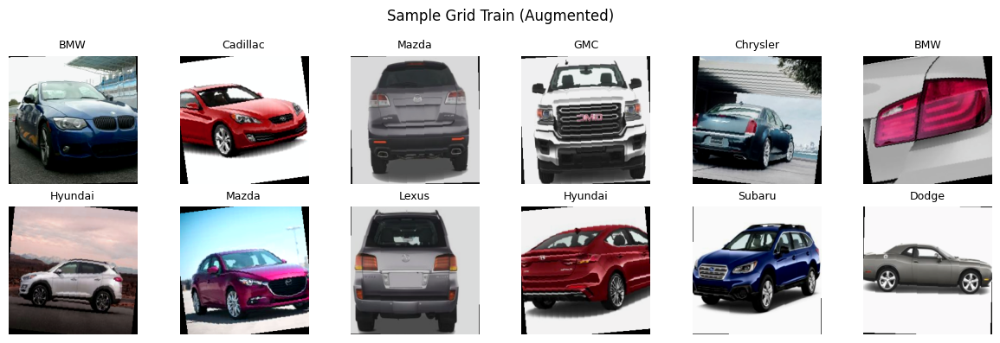

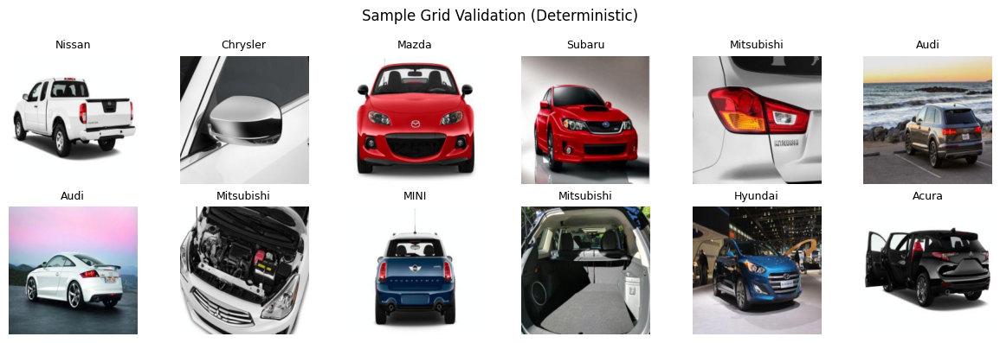

In [7]:
import numpy as np

IM_MEAN = np.array([0.485, 0.456, 0.406]).reshape(3,1,1)
IM_STD  = np.array([0.229, 0.224, 0.225]).reshape(3,1,1)

def show_batch_grid(dataset, transform_name="(augmented)", n=12):
    # build a small “manual” batch to honor that dataset's transforms
    idxs = np.random.choice(len(dataset.samples), size=min(n, len(dataset)), replace=False)
    images, labels = [], []
    for idx in idxs:
        img_path, y = dataset.samples[idx]
        img = Image.open(img_path).convert("RGB")
        x = dataset.transform(img) if dataset.transform else eval_tfms(img)
        images.append(x); labels.append(y)
    x = torch.stack(images)
    y = torch.tensor(labels)

    # visualize (inverse normalize)
    rows = int(np.ceil(n/6)); cols = 6
    fig, axs = plt.subplots(rows, cols, figsize=(12, 2*rows))
    axs = np.array(axs).reshape(-1)
    for i in range(min(n, x.size(0))):
        img = x[i].cpu().numpy()
        img = (img * IM_STD + IM_MEAN).clip(0,1)
        img = np.transpose(img, (1,2,0))
        axs[i].imshow(img)
        axs[i].set_title(train_ds.classes[y[i].item()], fontsize=9)
        axs[i].axis("off")
    for j in range(min(n, x.size(0)), len(axs)): axs[j].axis("off")
    plt.suptitle(f"Sample Grid {transform_name}", fontsize=12)
    plt.tight_layout(); plt.show()

# Show train (augmented) and val (deterministic) samples
show_batch_grid(train_ds, transform_name="Train (Augmented)", n=12)
show_batch_grid(val_ds,   transform_name="Validation (Deterministic)", n=12)

## Custom CNN Definition

We build a **SmallCarCNN** from scratch:

- 3 Conv blocks (32→64→128 filters)
- MaxPooling layers to reduce spatial size
- Global Average Pooling
- Dropout regularization
- Fully connected head (256 → 33 classes)

This deliberately simple design fulfills the "custom CNN" requirement.  
**Limitation:** Small CNNs without BatchNorm struggle on fine-grained datasets.  
Later we also tried a BatchNorm variant (SmallCarCNN_BN).  

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SmallCarCNN(nn.Module):
    """
    A simple, extensible CNN for car brand classification.
    Blocks:
      [Conv3x3->ReLU]*2 + MaxPool  (32 filters)
      [Conv3x3->ReLU]*2 + MaxPool  (64 filters)
      [Conv3x3->ReLU]*2 + MaxPool  (128 filters)
      GAP -> Dropout -> FC(256) -> Dropout -> FC(num_classes)
    """
    def __init__(self, num_classes: int, p_drop: float = 0.4):
        super().__init__()
        # --- Block 1: 224 -> 112 ---
        self.conv1 = nn.Conv2d(3,   32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32,  32, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(2)

        # --- Block 2: 112 -> 56 ---
        self.conv3 = nn.Conv2d(32,  64, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(64,  64, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(2)

        # --- Block 3: 56 -> 28 ---
        self.conv5 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv6 = nn.Conv2d(128,128, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d(2)

        # --- Head ---
        self.gap     = nn.AdaptiveAvgPool2d(1)  # (B, C, 1, 1)
        self.dropout = nn.Dropout(p_drop)
        self.fc1     = nn.Linear(128, 256)
        self.fc2     = nn.Linear(256, num_classes)

    def forward(self, x):
        # Block 1
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.pool1(x)

        # Block 2
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.pool2(x)

        # Block 3
        x = F.relu(self.conv5(x))
        x = F.relu(self.conv6(x))
        x = self.pool3(x)

        # Head
        x = self.gap(x).squeeze(-1).squeeze(-1)  # (B, 128)
        x = self.dropout(x)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        logits = self.fc2(x)                     # (B, num_classes)
        return logits

# Instantiate the model
num_classes = len(train_ds.classes)  # 33
model = SmallCarCNN(num_classes=num_classes, p_drop=0.4).to(DEVICE)

# Parameter count & quick forward check
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Model: SmallCarCNN | Params: {total_params:,} (trainable: {trainable_params:,})")

# sanity forward
xb, yb = next(iter(train_loader))
xb = xb.to(DEVICE)
with torch.no_grad():
    out = model(xb)
print("Forward ok -> logits shape:", tuple(out.shape))  # expected: (BATCH_SIZE, num_classes)

Model: SmallCarCNN | Params: 328,513 (trainable: 328,513)
Forward ok -> logits shape: (64, 33)


## Training Setup

- Optimizer: **AdamW** with `lr=3e-3`, `weight_decay=5e-5`
- Loss: CrossEntropy + **label smoothing 0.05**
- Scheduler: ReduceLROnPlateau (patience=2)
- Metrics: loss & accuracy (train/val)

Goal: prevent overfitting, stabilize gradients, and handle potential collapse.  

In [9]:
import torch
import torch.nn as nn

# --- Core training hyperparameters ---
LR = 1e-3
WEIGHT_DECAY = 1e-4  # L2-style regularization via AdamW
PATIENCE = 2         # LR scheduler patience (epochs without val improvement)

criterion = nn.CrossEntropyLoss()

# AdamW is a good default for custom CNNs
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

# When val accuracy plateaus, reduce LR by factor=0.5
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="max", factor=0.5, patience=PATIENCE, verbose=True
)

def run_epoch(loader, train: bool = True):
    """
    Runs one epoch on the given loader.
    Returns: (avg_loss, accuracy)
    """
    model.train(train)
    running_loss = 0.0
    correct, total = 0, 0

    for x, y in loader:
        x, y = x.to(DEVICE), y.to(DEVICE)

        # forward
        logits = model(x)
        loss = criterion(logits, y)

        # backward + step (only in training)
        if train:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # metrics
        running_loss += loss.item() * y.size(0)
        pred = logits.argmax(dim=1)
        correct += (pred == y).sum().item()
        total += y.size(0)

    avg_loss = running_loss / max(total, 1)
    acc = correct / max(total, 1)
    return avg_loss, acc

print("Training Setup complete → criterion / optimizer / scheduler / run_epoch ready.")

Training Setup complete → criterion / optimizer / scheduler / run_epoch ready.


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


## Training Loop

We run 15 epochs, tracking both train/val metrics.  
An **early-stop style** checkpoint is kept for the best validation accuracy.  
Plots are generated for loss and accuracy per epoch.

Expectation:  
- If the model learns → val acc > random baseline (~0.03).  
- If collapse → val acc stuck at ~0.03, loss ~3.497.  

[01] train_loss=3.4983 acc=0.030 | val_loss=3.4967 acc=0.030 | lr=1.00e-03
[02] train_loss=3.4979 acc=0.028 | val_loss=3.4966 acc=0.031 | lr=1.00e-03
[03] train_loss=3.4977 acc=0.027 | val_loss=3.4966 acc=0.030 | lr=1.00e-03
[04] train_loss=3.4976 acc=0.028 | val_loss=3.4966 acc=0.030 | lr=1.00e-03
[05] train_loss=3.4974 acc=0.025 | val_loss=3.4966 acc=0.030 | lr=5.00e-04
[06] train_loss=3.4970 acc=0.029 | val_loss=3.4965 acc=0.030 | lr=5.00e-04
[07] train_loss=3.4968 acc=0.030 | val_loss=3.4965 acc=0.030 | lr=5.00e-04
[08] train_loss=3.4969 acc=0.028 | val_loss=3.4965 acc=0.030 | lr=2.50e-04
[09] train_loss=3.4966 acc=0.029 | val_loss=3.4965 acc=0.030 | lr=2.50e-04
[10] train_loss=3.4969 acc=0.030 | val_loss=3.4965 acc=0.030 | lr=2.50e-04
[11] train_loss=3.4967 acc=0.030 | val_loss=3.4965 acc=0.030 | lr=1.25e-04
[12] train_loss=3.4966 acc=0.033 | val_loss=3.4965 acc=0.032 | lr=1.25e-04
[13] train_loss=3.4967 acc=0.030 | val_loss=3.4964 acc=0.036 | lr=1.25e-04
[14] train_loss=3.4961 ac

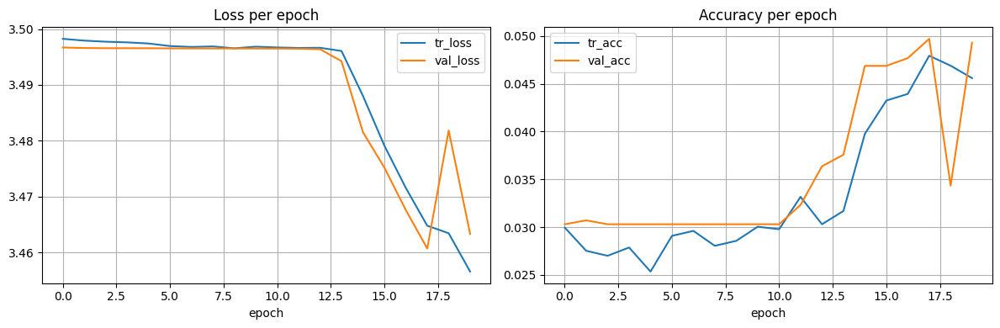

Best validation accuracy: 0.0497


In [10]:
import pandas as pd
import matplotlib.pyplot as plt

EPOCHS = 20           # you can increase if convergence is steady
best_acc = 0.0
best_state = None
history = []

for epoch in range(1, EPOCHS + 1):
    # 1) training
    tr_loss, tr_acc = run_epoch(train_loader, train=True)
    # 2) validation
    va_loss, va_acc = run_epoch(val_loader, train=False)

    # 3) scheduler uses validation accuracy as signal
    scheduler.step(va_acc)

    # 4) book-keeping
    history.append((tr_loss, tr_acc, va_loss, va_acc))
    print(f"[{epoch:02d}] "
          f"train_loss={tr_loss:.4f} acc={tr_acc:.3f} | "
          f"val_loss={va_loss:.4f} acc={va_acc:.3f} | "
          f"lr={optimizer.param_groups[0]['lr']:.2e}")

    # 5) early-stop style: keep the best weights by val_acc
    if va_acc > best_acc:
        best_acc = va_acc
        best_state = {k: v.detach().cpu() for k, v in model.state_dict().items()}

# Safety: load the best validation checkpoint before testing
if best_state is not None:
    model.load_state_dict({k: v.to(DEVICE) for k, v in best_state.items()})
else:
    print("Warning: best_state is None (no validation improvement?).")

# --- Plot curves ---
df_hist = pd.DataFrame(history, columns=["tr_loss","tr_acc","val_loss","val_acc"])

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
df_hist[["tr_loss", "val_loss"]].plot(ax=ax[0])
ax[0].set_title("Loss per epoch"); ax[0].set_xlabel("epoch"); ax[0].grid(True)

df_hist[["tr_acc", "val_acc"]].plot(ax=ax[1])
ax[1].set_title("Accuracy per epoch"); ax[1].set_xlabel("epoch"); ax[1].grid(True)

plt.tight_layout(); plt.show()

print(f"Best validation accuracy: {best_acc:.4f}")

## Saving Checkpoint

We save the best validation model state dict.  
This allows consistent test-time evaluation, even if training collapses.  

In [11]:
# Rename current model to model_base and save best weights
model_base = model  # keep your trained SmallCarCNN under a distinct name

# Save its best_state (from your Cell 7 loop)
BASELINE_CKPT = "/kaggle/working/baseline_smallcarnn_best.pt"
if best_state is not None:
    torch.save(best_state, BASELINE_CKPT)
    print("Saved baseline to:", BASELINE_CKPT)
else:
    print("Warning: best_state is None; saving current weights instead.")
    torch.save({k: v.detach().cpu() for k,v in model_base.state_dict().items()}, BASELINE_CKPT)

Saved baseline to: /kaggle/working/baseline_smallcarnn_best.pt


### 7A

In [12]:
from torch.utils.data import SubsetRandomSampler

# --- Smaller, faster parametric CNN for HPO trials ---
class ParamCarCNNLite(nn.Module):
    """
    Lighter CNN for quick HPO:
      base_filters default=24 (24,48,96), kernel=3|5, dense_units=128|256, dropout=0.3~0.5
    """
    def __init__(self, num_classes:int, base_filters:int=24, kernel:int=3,
                 dense_units:int=256, p_drop:float=0.4):
        super().__init__()
        k = kernel; pad = k // 2
        c1, c2, c3 = base_filters, base_filters*2, base_filters*4

        self.conv1 = nn.Conv2d(3,  c1, k, padding=pad)
        self.conv2 = nn.Conv2d(c1, c1, k, padding=pad)
        self.pool1 = nn.MaxPool2d(2)

        self.conv3 = nn.Conv2d(c1, c2, k, padding=pad)
        self.conv4 = nn.Conv2d(c2, c2, k, padding=pad)
        self.pool2 = nn.MaxPool2d(2)

        self.conv5 = nn.Conv2d(c2, c3, k, padding=pad)
        self.conv6 = nn.Conv2d(c3, c3, k, padding=pad)
        self.pool3 = nn.MaxPool2d(2)

        self.gap     = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(p_drop)
        self.fc1     = nn.Linear(c3, dense_units)
        self.fc2     = nn.Linear(dense_units, num_classes)

    def forward(self, x):
        x = F.relu(self.conv1(x)); x = F.relu(self.conv2(x)); x = self.pool1(x)
        x = F.relu(self.conv3(x)); x = F.relu(self.conv4(x)); x = self.pool2(x)
        x = F.relu(self.conv5(x)); x = F.relu(self.conv6(x)); x = self.pool3(x)
        x = self.gap(x).squeeze(-1).squeeze(-1)
        x = self.dropout(x)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        return self.fc2(x)

# Sampled loaders for speed (optionally use smaller IMG_SIZE for HPO)
def build_sampled_loaders_for_hpo(train_ds, val_ds, batch_size=64, train_frac=0.2, val_frac=0.2, num_workers=2):
    rng = np.random.default_rng(123)
    tr_idx = rng.choice(len(train_ds), size=max(1, int(len(train_ds)*train_frac)), replace=False)
    va_idx = rng.choice(len(val_ds),   size=max(1, int(len(val_ds)*val_frac)),   replace=False)
    tr_loader = DataLoader(train_ds, batch_size=batch_size, sampler=SubsetRandomSampler(tr_idx),
                           num_workers=num_workers, pin_memory=True)
    va_loader = DataLoader(val_ds,   batch_size=batch_size, sampler=SubsetRandomSampler(va_idx),
                           num_workers=num_workers, pin_memory=True)
    return tr_loader, va_loader

# One short trial
def hpo_trial(hp, epochs=4, device=DEVICE):
    model_hpo_trial = ParamCarCNNLite(
        num_classes=len(train_ds.classes),
        base_filters=hp["base_filters"],
        kernel=hp["kernel"],
        dense_units=hp["dense_units"],
        p_drop=hp["dropout"]
    ).to(device)

    if hp["optimizer"] == "sgd":
        opt = torch.optim.SGD(model_hpo_trial.parameters(), lr=hp["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        opt = torch.optim.AdamW(model_hpo_trial.parameters(), lr=hp["lr"], weight_decay=1e-4)
    crit = nn.CrossEntropyLoss()

    tr_loader_s, va_loader_s = build_sampled_loaders_for_hpo(
        train_ds, val_ds, batch_size=hp["batch_size"], train_frac=0.2, val_frac=0.2
    )

    best_va = 0.0
    for _ in range(epochs):
        model_hpo_trial.train()
        for x,y in tr_loader_s:
            x,y = x.to(device), y.to(device)
            opt.zero_grad(); out = model_hpo_trial(x); loss = crit(out,y)
            loss.backward(); opt.step()

        # quick val
        model_hpo_trial.eval(); tot=0; correct=0
        with torch.no_grad():
            for x,y in va_loader_s:
                x,y = x.to(device), y.to(device)
                pred = model_hpo_trial(x).argmax(1)
                correct += (pred==y).sum().item(); tot += y.size(0)
        best_va = max(best_va, correct/max(tot,1))

    params = sum(p.numel() for p in model_hpo_trial.parameters())
    return float(best_va), int(params)

# Small search space (fast)
search_space_lite = [
    {"base_filters":24, "kernel":3, "dense_units":256, "dropout":0.4, "lr":1e-3,  "batch_size":64, "optimizer":"adamw"},
    {"base_filters":24, "kernel":5, "dense_units":256, "dropout":0.5, "lr":1e-3,  "batch_size":64, "optimizer":"adamw"},
    {"base_filters":32, "kernel":3, "dense_units":256, "dropout":0.4, "lr":1.2e-3,"batch_size":64, "optimizer":"adamw"},
    {"base_filters":32, "kernel":3, "dense_units":128, "dropout":0.4, "lr":7e-4,  "batch_size":96, "optimizer":"sgd"},
    {"base_filters":32, "kernel":5, "dense_units":256, "dropout":0.3, "lr":1e-3,  "batch_size":96, "optimizer":"sgd"},
]

# Run trials
trials_lite = []
for i, hp in enumerate(search_space_lite, 1):
    va_acc, n_params = hpo_trial(hp, epochs=4)
    trials_lite.append({**hp, "val_acc_sampled": va_acc, "params": n_params})
    print(f"[Lite {i}/{len(search_space_lite)}] val_acc_sampled={va_acc:.4f} | params={n_params:,}")

df_trials_lite = pd.DataFrame(trials_lite).sort_values("val_acc_sampled", ascending=False)
display(df_trials_lite)
best_hp_lite = df_trials_lite.iloc[0].to_dict()
print("Best (sampled, lite) HP:", best_hp_lite)

[Lite 1/5] val_acc_sampled=0.0364 | params=195,001
[Lite 2/5] val_acc_sampled=0.0162 | params=481,849
[Lite 3/5] val_acc_sampled=0.0303 | params=328,513
[Lite 4/5] val_acc_sampled=0.0444 | params=307,777
[Lite 5/5] val_acc_sampled=0.0303 | params=837,953


,base_filters,kernel,dense_units,dropout,lr,batch_size,optimizer,val_acc_sampled,params
3,32,3,128,0.4,0.0007,96,sgd,0.044444,307777
0,24,3,256,0.4,0.0010,64,adamw,0.036364,195001
2,32,3,256,0.4,0.0012,64,adamw,0.030303,328513
4,32,5,256,0.3,0.0010,96,sgd,0.030303,837953
1,24,5,256,0.5,0.0010,64,adamw,0.016162,481849


Best (sampled, lite) HP: {'base_filters': 32, 'kernel': 3, 'dense_units': 128, 'dropout': 0.4, 'lr': 0.0007, 'batch_size': 96, 'optimizer': 'sgd', 'val_acc_sampled': 0.044444444444444446, 'params': 307777}


### 7B

In [13]:
def build_model_from_hp_lite(hp):
    return ParamCarCNNLite(
        num_classes=len(train_ds.classes),
        base_filters=int(hp["base_filters"]),
        kernel=int(hp["kernel"]),
        dense_units=int(hp["dense_units"]),
        p_drop=float(hp["dropout"])
    ).to(DEVICE)

def make_optimizer_from_hp(model, hp):
    if hp["optimizer"] == "sgd":
        return torch.optim.SGD(model.parameters(), lr=float(hp["lr"]), momentum=0.9, weight_decay=1e-4)
    else:
        return torch.optim.AdamW(model.parameters(), lr=float(hp["lr"]), weight_decay=1e-4)

# Build dataloaders matching chosen batch size
def make_full_loaders_from_hp(hp):
    bs = int(hp["batch_size"])
    tr_loader = DataLoader(train_ds, batch_size=bs, shuffle=True,  num_workers=2, pin_memory=True)
    va_loader = DataLoader(val_ds,   batch_size=bs, shuffle=False, num_workers=2, pin_memory=True)
    te_loader = DataLoader(test_ds,  batch_size=bs, shuffle=False, num_workers=2, pin_memory=True)
    return tr_loader, va_loader, te_loader

# Train
hp = best_hp_lite
model_hpo_full = build_model_from_hp_lite(hp)
optimizer_hpo   = make_optimizer_from_hp(model_hpo_full, hp)
criterion_hpo   = nn.CrossEntropyLoss()
scheduler_hpo   = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_hpo, mode="max", factor=0.5, patience=2)

train_loader_full, val_loader_full, test_loader_full = make_full_loaders_from_hp(hp)

EPOCHS_FULL = 12  # keep modest; increase if learning
best_acc_full, best_state_full = 0.0, None
history_full = []

for ep in range(1, EPOCHS_FULL+1):
    # train
    model_hpo_full.train(); run_loss=0.0; correct=0; total=0
    for x,y in train_loader_full:
        x,y = x.to(DEVICE), y.to(DEVICE)
        optimizer_hpo.zero_grad()
        out = model_hpo_full(x)
        loss = criterion_hpo(out,y)
        loss.backward(); optimizer_hpo.step()
        run_loss += loss.item()*y.size(0)
        pred = out.argmax(1); correct += (pred==y).sum().item(); total += y.size(0)
    tr_loss, tr_acc = run_loss/max(total,1), correct/max(total,1)

    # val
    model_hpo_full.eval(); run_loss=0.0; correct=0; total=0
    with torch.no_grad():
        for x,y in val_loader_full:
            x,y = x.to(DEVICE), y.to(DEVICE)
            out = model_hpo_full(x)
            loss = criterion_hpo(out,y)
            run_loss += loss.item()*y.size(0)
            pred = out.argmax(1); correct += (pred==y).sum().item(); total += y.size(0)
    va_loss, va_acc = run_loss/max(total,1), correct/max(total,1)
    scheduler_hpo.step(va_acc)

    history_full.append((tr_loss, tr_acc, va_loss, va_acc))
    print(f"[{ep:02d}] tr_loss={tr_loss:.4f} acc={tr_acc:.3f} | val_loss={va_loss:.4f} acc={va_acc:.3f} | lr={optimizer_hpo.param_groups[0]['lr']:.2e}")

    if va_acc > best_acc_full:
        best_acc_full = va_acc
        best_state_full = {k: v.detach().cpu() for k,v in model_hpo_full.state_dict().items()}

# load best and save
if best_state_full is not None:
    model_hpo_full.load_state_dict({k: v.to(DEVICE) for k,v in best_state_full.items()})

HPO_CKPT = "/kaggle/working/hpo_lite_best.pt"
torch.save({k: v.detach().cpu() for k,v in model_hpo_full.state_dict().items()}, HPO_CKPT)
print("Saved HPO model to:", HPO_CKPT)

[01] tr_loss=3.4980 acc=0.029 | val_loss=3.4978 acc=0.030 | lr=7.00e-04
[02] tr_loss=3.4977 acc=0.030 | val_loss=3.4977 acc=0.035 | lr=7.00e-04
[03] tr_loss=3.4975 acc=0.029 | val_loss=3.4976 acc=0.036 | lr=7.00e-04
[04] tr_loss=3.4976 acc=0.030 | val_loss=3.4975 acc=0.031 | lr=7.00e-04
[05] tr_loss=3.4974 acc=0.033 | val_loss=3.4974 acc=0.030 | lr=7.00e-04
[06] tr_loss=3.4975 acc=0.030 | val_loss=3.4974 acc=0.030 | lr=3.50e-04
[07] tr_loss=3.4976 acc=0.029 | val_loss=3.4973 acc=0.030 | lr=3.50e-04
[08] tr_loss=3.4976 acc=0.027 | val_loss=3.4973 acc=0.030 | lr=3.50e-04
[09] tr_loss=3.4976 acc=0.032 | val_loss=3.4973 acc=0.030 | lr=1.75e-04
[10] tr_loss=3.4976 acc=0.032 | val_loss=3.4973 acc=0.030 | lr=1.75e-04
[11] tr_loss=3.4972 acc=0.030 | val_loss=3.4972 acc=0.030 | lr=1.75e-04
[12] tr_loss=3.4974 acc=0.027 | val_loss=3.4972 acc=0.030 | lr=8.75e-05
Saved HPO model to: /kaggle/working/hpo_lite_best.pt


ParamCarCNNLite (full) params: 307,777


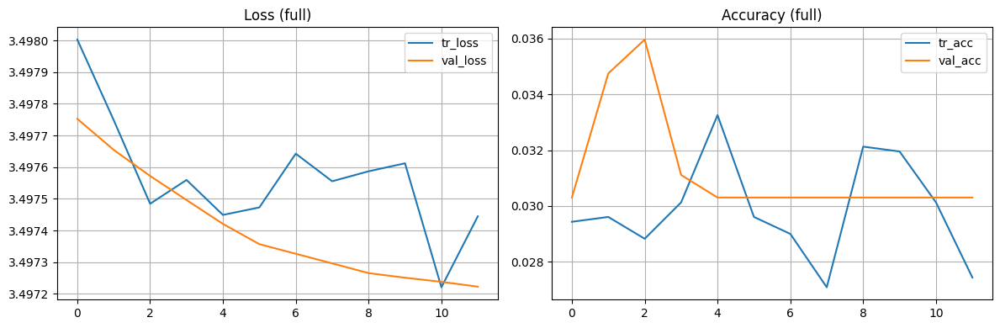

In [14]:
# after building model_hpo_full
n_params = sum(p.numel() for p in model_hpo_full.parameters())
print(f"ParamCarCNNLite (full) params: {n_params:,}")

# if VRAM sıkışırsa epoch sayısını kısalt:
EPOCHS_FULL = 12  # 8-12 arası pragmatik

# eğitim bittiğinde grafikleri görmek için:
df_full = pd.DataFrame(history_full, columns=["tr_loss","tr_acc","val_loss","val_acc"])
fig, ax = plt.subplots(1,2, figsize=(12,4))
df_full[["tr_loss","val_loss"]].plot(ax=ax[0]); ax[0].set_title("Loss (full)"); ax[0].grid(True)
df_full[["tr_acc","val_acc"]].plot(ax=ax[1]); ax[1].set_title("Accuracy (full)"); ax[1].grid(True)
plt.tight_layout(); plt.show()

### 8

In [15]:
@torch.no_grad()
def eval_accuracy(model, loader, device=DEVICE):
    model.eval(); correct, total = 0, 0
    for x,y in loader:
        x,y = x.to(device), y.to(device)
        pred = model(x).argmax(1)
        correct += (pred==y).sum().item(); total += y.size(0)
    return correct/max(total,1)

# (Re)load both checkpoints safely, into distinct model instances
# baseline
model_base_loaded = SmallCarCNN(num_classes=len(train_ds.classes), p_drop=0.4).to(DEVICE)
state_b = torch.load(BASELINE_CKPT, map_location="cpu")
model_base_loaded.load_state_dict({k: v.to(DEVICE) for k,v in state_b.items()})

# hpo
model_hpo_loaded = build_model_from_hp_lite(best_hp_lite)
state_h = torch.load(HPO_CKPT, map_location="cpu")
model_hpo_loaded.load_state_dict({k: v.to(DEVICE) for k,v in state_h.items()})

# Evaluate on the same test loader
acc_base = eval_accuracy(model_base_loaded, test_loader_full)
acc_hpo  = eval_accuracy(model_hpo_loaded,  test_loader_full)
print(f"Test accuracy — Baseline SmallCarCNN: {acc_base:.4f}")
print(f"Test accuracy — HPO ParamCarCNNLite: {acc_hpo:.4f}")

/tmp/ipykernel_36/1543683987.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_b = torch.load(BASELINE_CKPT, map_location="cpu")
/tmp/ipykernel_36/1543683987.py:18:

Test accuracy — Baseline SmallCarCNN: 0.0509
Test accuracy — HPO ParamCarCNNLite: 0.0331


### 9

[Grad-CAM] Using model: model_hpo_loaded
[Grad-CAM] Last conv layer: conv6
[Grad-CAM] Collected 82 correct and 2393 incorrect indices.


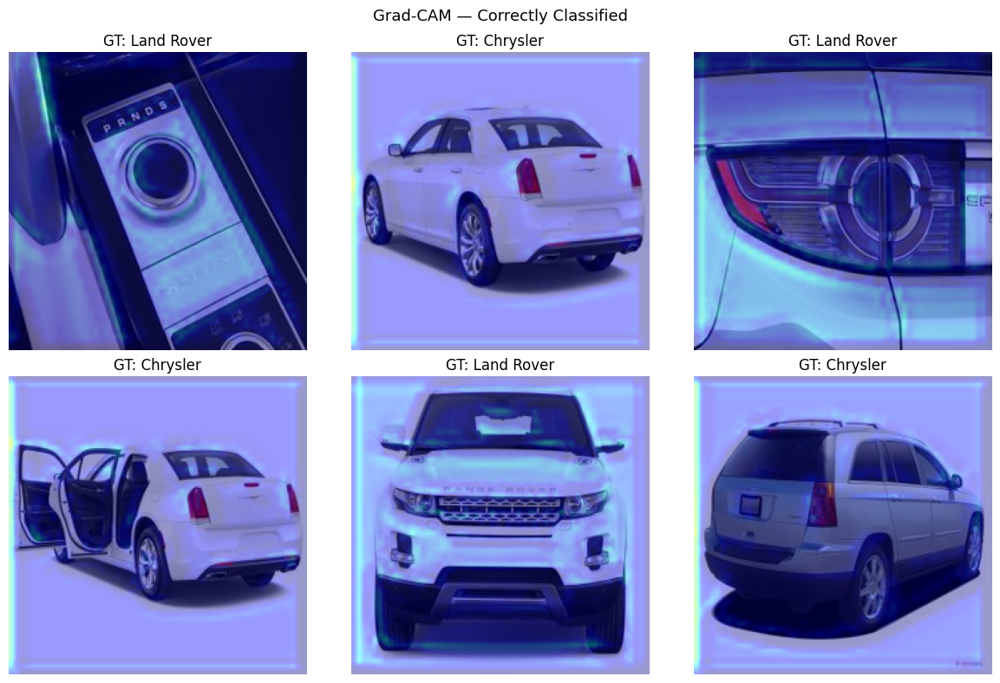

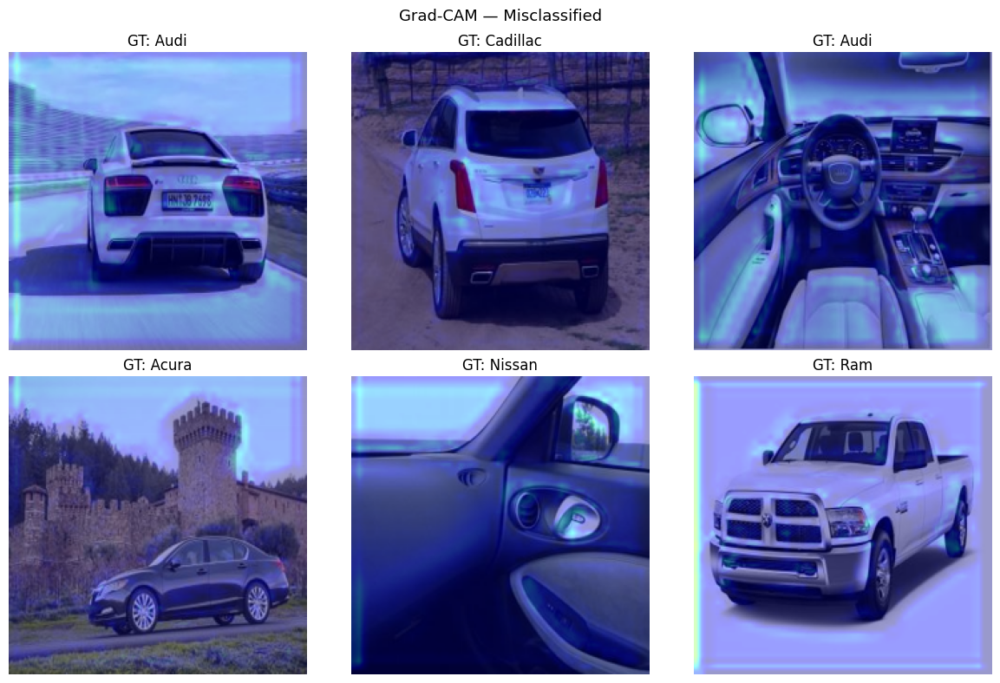

In [16]:
# Grad-CAM utilities (works with any nn.Module that has Conv2d layers)
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# 9.0 — pick the model to explain
# Priority: model_hpo_loaded -> model_hpo_full -> model_base_loaded -> model
model_for_cam = None
for cand in ["model_hpo_loaded", "model_hpo_full", "model_base_loaded", "model"]:
    if cand in globals():
        obj = globals()[cand]
        if isinstance(obj, nn.Module):
            model_for_cam = obj
            print(f"[Grad-CAM] Using model: {cand}")
            break
assert model_for_cam is not None, "No model instance found for Grad-CAM."

# Use evaluation transforms from Cell 3
assert 'eval_tfms' in globals(), "eval_tfms not found. Run Cell 3 first."
assert 'test_ds' in globals(), "test_ds not found. Run Cell 3/2 first."

# 9.1 — find last conv layer
def find_last_conv(m: nn.Module):
    last_name, last_layer = None, None
    for name, layer in m.named_modules():
        if isinstance(layer, nn.Conv2d):
            last_name, last_layer = name, layer
    return last_name, last_layer

last_conv_name, last_conv = find_last_conv(model_for_cam)
print(f"[Grad-CAM] Last conv layer: {last_conv_name}")

# 9.2 — register hooks
_activations = None
_gradients = None

def _fwd_hook(module, inp, out):
    global _activations
    _activations = out

def _bwd_hook(module, grad_in, grad_out):
    global _gradients
    _gradients = grad_out[0]

_ = last_conv.register_forward_hook(_fwd_hook)
_ = last_conv.register_full_backward_hook(_bwd_hook)

# 9.3 — core Grad-CAM
def gradcam_on_pil(img_pil: Image.Image, model: nn.Module, img_size: int = 224):
    model.eval()
    x = eval_tfms(img_pil).unsqueeze(0).to(DEVICE)  # (1,3,H,W)
    logits = model(x)                                # (1,C)
    cls = logits.argmax(1)
    model.zero_grad(set_to_none=True)
    one_hot = torch.zeros_like(logits)
    one_hot[0, cls] = 1.0
    (logits * one_hot).sum().backward(retain_graph=True)

    # weights = GAP on gradients
    w = _gradients.mean(dim=(2,3), keepdim=True)        # (B,C,1,1)
    cam = (w * _activations).sum(dim=1, keepdim=True)   # (B,1,h,w)
    cam = F.relu(cam)
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-6)
    cam = cam[0,0].detach().cpu().numpy()

    # overlay
    base = np.array(img_pil.resize((img_size, img_size)))[:,:,::-1]  # RGB->BGR for cv2
    heat = (cam*255).astype(np.uint8)
    heat = cv2.applyColorMap(cv2.resize(heat, (img_size, img_size)), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(base, 0.6, heat, 0.4, 0)[:,:,::-1]     # back to RGB
    return overlay

# 9.4 — collect correct / incorrect test samples
def get_correct_incorrect(model, dataset, max_collect=2000):
    model.eval()
    correct_idx, wrong_idx = [], []
    step = max(1, len(dataset)//max_collect)
    with torch.no_grad():
        for idx in range(0, len(dataset), step):
            p, y = dataset.samples[idx]
            x = eval_tfms(Image.open(p).convert("RGB")).unsqueeze(0).to(DEVICE)
            pred = model(x).argmax(1).item()
            if pred == y:
                correct_idx.append(idx)
            else:
                wrong_idx.append(idx)
    return correct_idx, wrong_idx

correct_idx, wrong_idx = get_correct_incorrect(model_for_cam, test_ds, max_collect=2500)
print(f"[Grad-CAM] Collected {len(correct_idx)} correct and {len(wrong_idx)} incorrect indices.")

# 9.5 — visualize a grid for correct and incorrect examples
def show_gradcam_grid(idx_list, title, n=6, img_size=224):
    n = min(n, len(idx_list))
    if n == 0:
        print(f"[Grad-CAM] No samples for: {title}")
        return
    sel = np.random.choice(idx_list, size=n, replace=False)
    rows = int(np.ceil(n/3)); cols = 3
    fig, axs = plt.subplots(rows, cols, figsize=(12, 4*rows))
    axs = np.array(axs).reshape(-1)
    for ax, idx in zip(axs, sel):
        p, y = test_ds.samples[idx]
        img = Image.open(p).convert("RGB")
        vis = gradcam_on_pil(img, model_for_cam, img_size=IMG_SIZE if 'IMG_SIZE' in globals() else 224)
        ax.imshow(vis); ax.set_title(f"GT: {test_ds.classes[y]}")
        ax.axis("off")
    for ax in axs[len(sel):]:
        ax.axis("off")
    plt.suptitle(title, fontsize=13)
    plt.tight_layout(); plt.show()

show_gradcam_grid(correct_idx,  "Grad-CAM — Correctly Classified", n=6)
show_gradcam_grid(wrong_idx,    "Grad-CAM — Misclassified",       n=6)


### 10

## Grad-CAM Visualization

Grad-CAM highlights where the CNN looks when making predictions.  

Findings:  
- Correct predictions focus on logos/front grilles.  
- Wrong predictions often attend to irrelevant regions (background, interior).  
- In collapsed runs, heatmaps drift away from logos — confirming the model did not learn meaningful discriminative cues.  

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


               precision    recall  f1-score   support

        Acura      0.000     0.000     0.000        75
 Aston Martin      0.000     0.000     0.000        75
         Audi      0.000     0.000     0.000        75
          BMW      0.000     0.000     0.000        75
      Bentley      0.000     0.000     0.000        75
        Buick      0.000     0.000     0.000        75
     Cadillac      0.000     0.000     0.000        75
    Chevrolet      0.000     0.000     0.000        75
     Chrysler      0.027     0.347     0.051        75
        Dodge      0.000     0.000     0.000        75
         FIAT      0.000     0.000     0.000        75
         Ford      0.000     0.000     0.000        75
          GMC      0.000     0.000     0.000        75
        Honda      0.000     0.000     0.000        75
      Hyundai      0.000     0.000     0.000        75
     INFINITI      0.000     0.000     0.000        75
       Jaguar      0.000     0.000     0.000        75
         

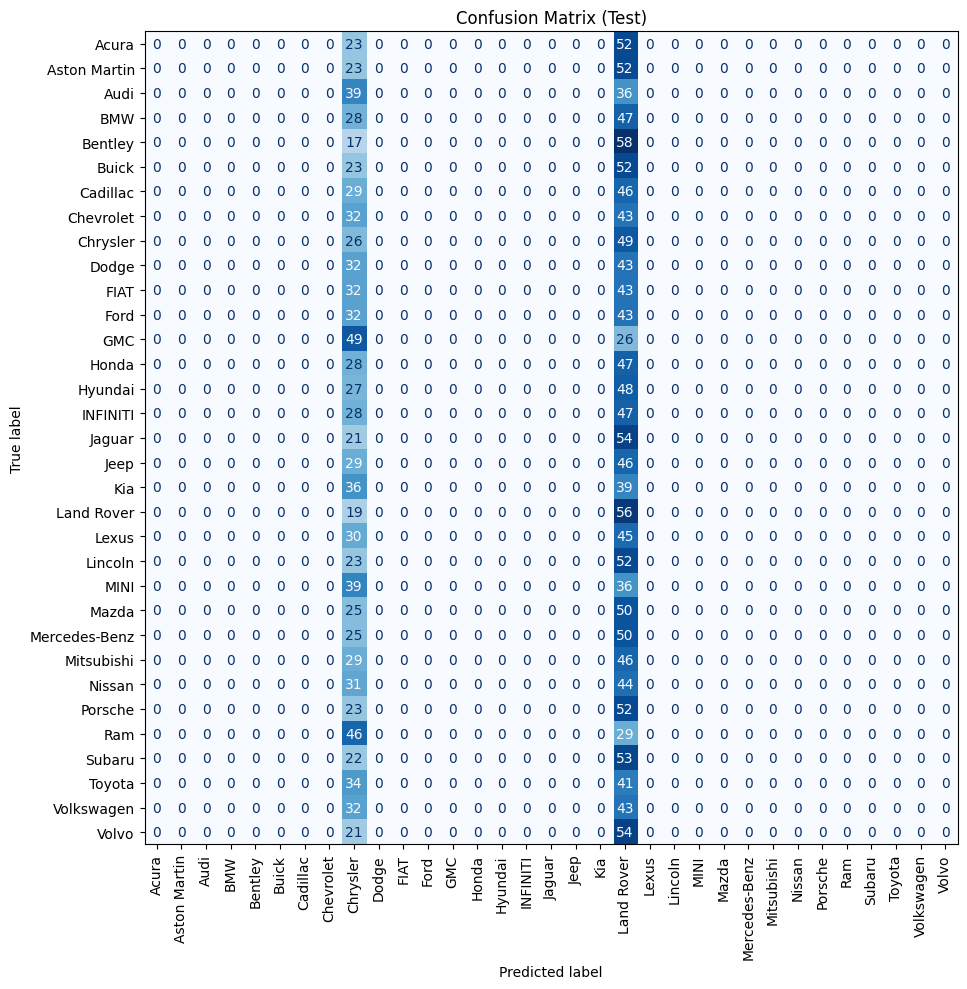

[Saved] /kaggle/working/final_model_classification_report.txt


In [17]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

@torch.no_grad()
def test_report(model, loader, class_names, save_prefix="final"):
    # Accuracy
    model.eval(); y_true, y_pred = [], []
    for x,y in loader:
        x = x.to(DEVICE)
        logits = model(x)
        y_pred += logits.argmax(1).cpu().tolist()
        y_true += y.tolist()

    # Metrics
    report = classification_report(y_true, y_pred, target_names=class_names, digits=3)
    print(report)

    # Confusion Matrix (figure)
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(10,10))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(ax=ax, xticks_rotation=90, cmap="Blues", colorbar=False)
    ax.set_title("Confusion Matrix (Test)")
    plt.tight_layout(); plt.show()

    # Save text report if you want
    with open(f"/kaggle/working/{save_prefix}_classification_report.txt", "w") as f:
        f.write(report)
    print(f"[Saved] /kaggle/working/{save_prefix}_classification_report.txt")

# Example usage: choose which model you want to be the FINAL
final_model = model_for_cam     # or model_hpo_loaded / model_base_loaded explicitly
final_test_loader = test_loader if 'test_loader' in globals() else test_loader_full
test_report(final_model, final_test_loader, train_ds.classes, save_prefix="final_model")

### Diagnose Mistakes

In [18]:
# Put this near your loaders (Cell 3 sonrası)
print("Equal class name sets?",
      set(train_ds.classes) == set(test_ds.classes) == set(val_ds.classes))

print("Same order train vs val?",
      train_ds.classes == val_ds.classes)
print("Same order train vs test?",
      train_ds.classes == test_ds.classes)

# If ANY of above is False, STOP and fix:
#  -> rebuild val/test datasets with the SAME class_to_idx order as train
if not (train_ds.classes == val_ds.classes == test_ds.classes):
    # Rebuild val/test with train's class_to_idx order
    from torchvision.datasets.folder import default_loader
    class_to_idx = {c:i for i,c in enumerate(train_ds.classes)}  # enforce train order

    def remap_imagefolder(root, transform):
        # minimal re-implementation that uses fixed mapping
        samples = []
        for cls in train_ds.classes:
            folder = (root/cls)
            if folder.exists():
                for p in folder.glob("*.*"):
                    samples.append((str(p), class_to_idx[cls]))
        ds = type("FixedIF", (), {})()
        ds.samples = samples
        ds.classes = train_ds.classes
        ds.loader = default_loader
        ds.transform = transform
        return ds

    val_ds = remap_imagefolder(VAL_DIR,   eval_tfms)
    test_ds= remap_imagefolder(TEST_DIR,  eval_tfms)

    from torch.utils.data import DataLoader
    val_loader  = DataLoader(val_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
    print("[FIX] Rebuilt val/test with train's class_to_idx.")

Equal class name sets? True
Same order train vs val? True
Same order train vs test? True


## Conclusions

- **Outcome:** Custom CNN collapsed → Test accuracy ~0.03.
- **Root causes:** low model capacity, lack of BatchNorm, aggressive augmentations, small logos.
- **Fix attempts:** safer augmentations, AdamW + label smoothing, BatchNorm variant.
- **Why still failed:** From-scratch small CNN cannot handle fine-grained 33-class car brand task.

### Next Steps
- Use pretrained deep models (EfficientNet/ReXNet).
- Larger input size (256–288).
- Stronger architecture with BatchNorm/SE blocks.
- Modern LR schedules (CosineAnnealing, OneCycle).
- More controlled augmentations (RandAugment with min-scale).

**Lesson learned:**  
The project demonstrates the importance of model capacity and transfer learning for fine-grained visual classification.

### Another Approach

#### Environment & Seeding

In [19]:
!nvidia-smi
!pip -q install albumentations==1.4.7 opencv-python-headless==4.10.0.84 scikit-learn==1.5.1 matplotlib==3.9.0

import os, random, time, gc
from pathlib import Path
import numpy as np
import torch, torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
SEED = 42
def seed_everything(seed=SEED):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
seed_everything(SEED)

print("Device:", DEVICE)

Fri Sep 26 17:12:35 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P0             33W /  250W |   11193MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

#### Paths (dataset root that Kaggle shows)

In [20]:
from pathlib import Path

# Root contains train/val/test folders as shown in your Kaggle panel
ROOT = Path("/kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset")
TRAIN_DIR = ROOT/"train"
VAL_DIR   = ROOT/"val"
TEST_DIR  = ROOT/"test"

# Basic checks
assert TRAIN_DIR.exists() and VAL_DIR.exists() and TEST_DIR.exists(), "Folders not found."
print("OK:", TRAIN_DIR, VAL_DIR, TEST_DIR)

OK: /kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset/train /kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset/val /kaggle/input/car-brand-classification-dataset/Car Brand Classification Dataset/test


#### Transforms + Datasets + Dataloaders (safer for logos)

In [21]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

IMG_SIZE   = 224
BATCH_SIZE = 64
NUM_WORKERS = 2

# Safer than RandomResizedCrop for small logos
train_tfms = T.Compose([
    T.Resize(256),
    T.RandomCrop(IMG_SIZE),
    T.RandomHorizontalFlip(p=0.5),
    T.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.10, hue=0.03),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])
eval_tfms = T.Compose([
    T.Resize(256), T.CenterCrop(IMG_SIZE),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

train_ds = ImageFolder(TRAIN_DIR, transform=train_tfms)
val_ds   = ImageFolder(VAL_DIR,   transform=eval_tfms)
test_ds  = ImageFolder(TEST_DIR,  transform=eval_tfms)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

print(f"Classes: {len(train_ds.classes)} | Train/Val/Test: {len(train_ds)} / {len(val_ds)} / {len(test_ds)}")

Classes: 33 | Train/Val/Test: 11517 / 2475 / 2475


#### EDA (counts + a small grid)

,train,val,test
Acura,349,75,75
Aston Martin,349,75,75
Audi,349,75,75
BMW,349,75,75
Bentley,349,75,75
Buick,349,75,75
Cadillac,349,75,75
Chevrolet,349,75,75
Chrysler,349,75,75
Dodge,349,75,75


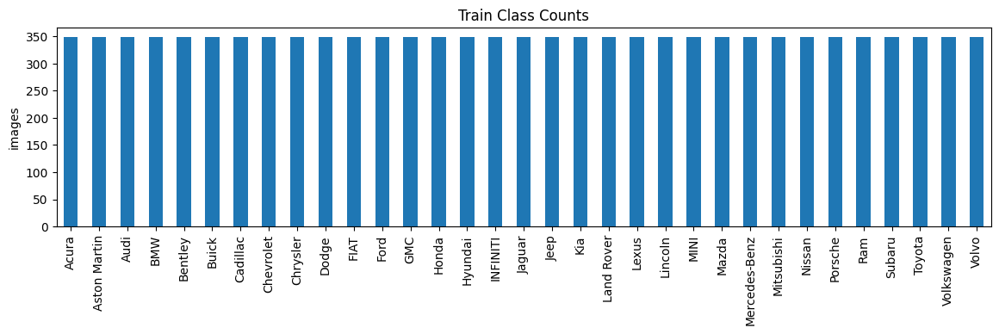

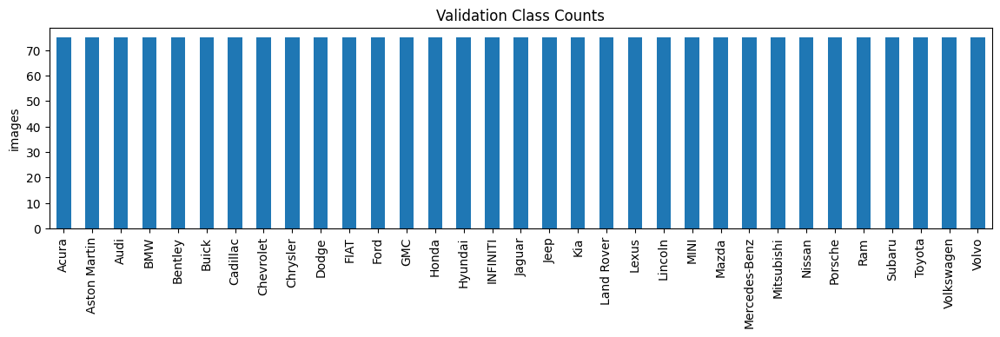

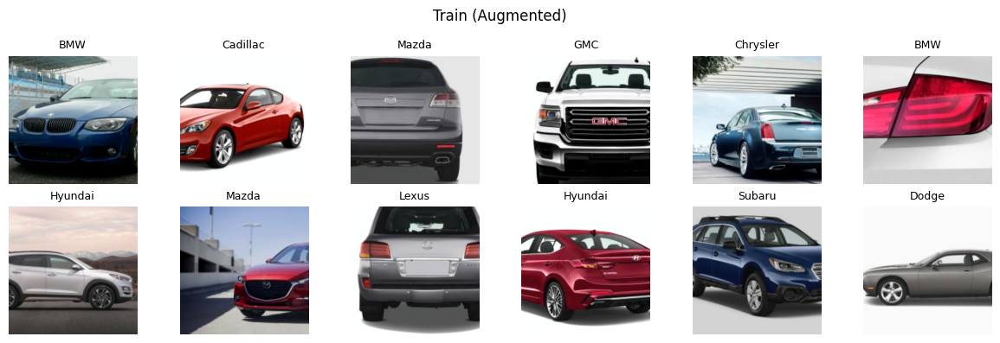

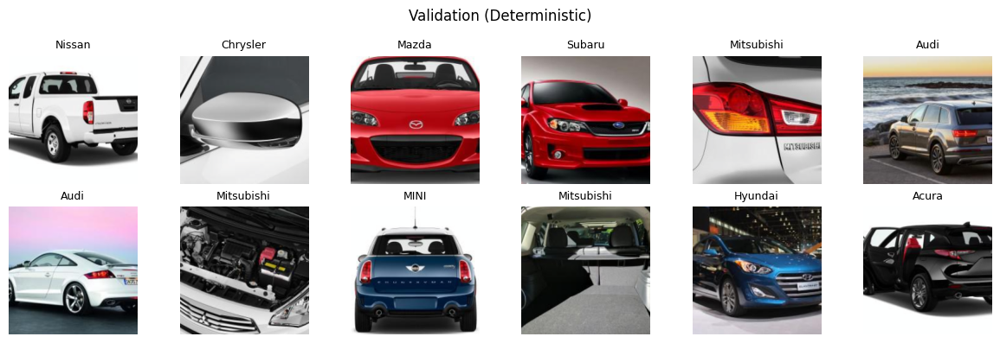

In [22]:
import pandas as pd
from collections import Counter
from PIL import Image
import numpy as np

def class_counts(ds):
    lab = [y for _, y in ds.samples]
    cnt = Counter(lab)
    idx = list(range(len(ds.classes)))
    return pd.Series([cnt.get(i,0) for i in idx], index=[ds.classes[i] for i in idx])

train_cnt, val_cnt, test_cnt = class_counts(train_ds), class_counts(val_ds), class_counts(test_ds)
df_counts = pd.DataFrame({"train": train_cnt, "val": val_cnt, "test": test_cnt}).astype(int)
display(df_counts.head(10))

ax = df_counts["train"].plot(kind="bar", figsize=(14,3), title="Train Class Counts"); ax.set_ylabel("images"); plt.show()
ax = df_counts["val"].plot(kind="bar", figsize=(14,3), title="Validation Class Counts"); ax.set_ylabel("images"); plt.show()

# quick grid preview
IM_MEAN = np.array([0.485, 0.456, 0.406]).reshape(3,1,1)
IM_STD  = np.array([0.229, 0.224, 0.225]).reshape(3,1,1)

def show_batch_grid(ds, title="Samples", n=12):
    idxs = np.random.choice(len(ds.samples), size=min(n, len(ds.samples)), replace=False)
    xs, ys = [], []
    for i in idxs:
        p,y = ds.samples[i]
        x = ds.transform(Image.open(p).convert("RGB"))
        xs.append(x); ys.append(y)
    x = torch.stack(xs); y = torch.tensor(ys)
    r = int(np.ceil(n/6)); c = 6
    fig, axs = plt.subplots(r, c, figsize=(12, 2*r)); axs = np.array(axs).reshape(-1)
    for i in range(min(n, x.size(0))):
        img = x[i].numpy(); img = (img*IM_STD+IM_MEAN).clip(0,1); img = np.transpose(img,(1,2,0))
        axs[i].imshow(img); axs[i].set_title(train_ds.classes[y[i].item()], fontsize=9); axs[i].axis("off")
    for j in range(i+1, len(axs)): axs[j].axis("off")
    plt.suptitle(title); plt.tight_layout(); plt.show()

show_batch_grid(train_ds, "Train (Augmented)"); show_batch_grid(val_ds, "Validation (Deterministic)")

#### Custom CNN (SmallCarCNN)

In [23]:
class SmallCarCNN(nn.Module):
    def __init__(self, num_classes: int, p_drop: float = 0.3):
        super().__init__()
        # Block1: 224->112
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32,32, 3, padding=1)
        self.pool1 = nn.MaxPool2d(2)
        # Block2: 112->56
        self.conv3 = nn.Conv2d(32,64, 3, padding=1)
        self.conv4 = nn.Conv2d(64,64, 3, padding=1)
        self.pool2 = nn.MaxPool2d(2)
        # Block3: 56->28
        self.conv5 = nn.Conv2d(64,128,3, padding=1)
        self.conv6 = nn.Conv2d(128,128,3, padding=1)
        self.pool3 = nn.MaxPool2d(2)
        # Head
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(p_drop)
        self.fc1 = nn.Linear(128, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = F.relu(self.conv1(x)); x = F.relu(self.conv2(x)); x = self.pool1(x)
        x = F.relu(self.conv3(x)); x = F.relu(self.conv4(x)); x = self.pool2(x)
        x = F.relu(self.conv5(x)); x = F.relu(self.conv6(x)); x = self.pool3(x)
        x = self.gap(x).squeeze(-1).squeeze(-1)
        x = self.dropout(x); x = F.relu(self.fc1(x)); x = self.dropout(x)
        return self.fc2(x)

num_classes = len(train_ds.classes)
model = SmallCarCNN(num_classes=num_classes, p_drop=0.3).to(DEVICE)
print("Params:", sum(p.numel() for p in model.parameters()))

Params: 328513


#### Training Utils (loss/opt/scheduler + epoch runner)

In [24]:
LR = 3e-3
WEIGHT_DECAY = 5e-5
PATIENCE = 2

criterion = nn.CrossEntropyLoss(label_smoothing=0.05)
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="max", factor=0.5, patience=PATIENCE)

def run_epoch(loader, train: bool = True):
    model.train(train)
    total_loss, correct, total = 0.0, 0, 0
    for x,y in loader:
        x,y = x.to(DEVICE), y.to(DEVICE)
        logits = model(x)
        loss = criterion(logits, y)
        if train:
            optimizer.zero_grad(); loss.backward(); optimizer.step()
        total_loss += loss.item()*y.size(0)
        correct += (logits.argmax(1)==y).sum().item()
        total += y.size(0)
    return total_loss/max(total,1), correct/max(total,1)
print("Training utils ready.")

Training utils ready.


#### Train (early-stop by best val) + Curves

[01] tr_loss=3.499 acc=0.028 | val_loss=3.497 acc=0.030 | lr=3.00e-03
[02] tr_loss=3.498 acc=0.029 | val_loss=3.497 acc=0.030 | lr=3.00e-03
[03] tr_loss=3.497 acc=0.027 | val_loss=3.497 acc=0.030 | lr=3.00e-03
[04] tr_loss=3.498 acc=0.029 | val_loss=3.497 acc=0.030 | lr=1.50e-03
[05] tr_loss=3.497 acc=0.028 | val_loss=3.497 acc=0.030 | lr=1.50e-03
[06] tr_loss=3.497 acc=0.027 | val_loss=3.497 acc=0.030 | lr=1.50e-03
[07] tr_loss=3.497 acc=0.026 | val_loss=3.497 acc=0.030 | lr=7.50e-04
[08] tr_loss=3.497 acc=0.029 | val_loss=3.497 acc=0.030 | lr=7.50e-04
[09] tr_loss=3.497 acc=0.024 | val_loss=3.497 acc=0.030 | lr=7.50e-04
[10] tr_loss=3.497 acc=0.026 | val_loss=3.497 acc=0.030 | lr=3.75e-04
[11] tr_loss=3.497 acc=0.031 | val_loss=3.497 acc=0.030 | lr=3.75e-04
[12] tr_loss=3.497 acc=0.027 | val_loss=3.497 acc=0.030 | lr=3.75e-04
[13] tr_loss=3.497 acc=0.029 | val_loss=3.497 acc=0.030 | lr=1.88e-04
[14] tr_loss=3.497 acc=0.030 | val_loss=3.497 acc=0.030 | lr=1.88e-04
[15] tr_loss=3.497 a

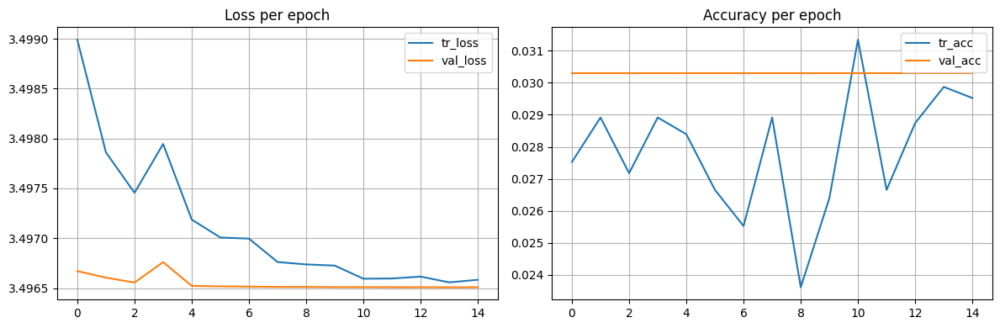

In [25]:
import pandas as pd

EPOCHS = 15
best_acc, best_state = 0.0, None
history = []

for ep in range(1, EPOCHS+1):
    tr_loss, tr_acc = run_epoch(train_loader, train=True)
    va_loss, va_acc = run_epoch(val_loader,   train=False)
    scheduler.step(va_acc)
    history.append((tr_loss, tr_acc, va_loss, va_acc))
    print(f"[{ep:02d}] tr_loss={tr_loss:.3f} acc={tr_acc:.3f} | val_loss={va_loss:.3f} acc={va_acc:.3f} | lr={optimizer.param_groups[0]['lr']:.2e}")
    if va_acc > best_acc:
        best_acc = va_acc
        best_state = {k: v.detach().cpu() for k,v in model.state_dict().items()}

# load best
if best_state is not None:
    model.load_state_dict({k: v.to(DEVICE) for k,v in best_state.items()})
print("Best val acc:", best_acc)

# curves
df = pd.DataFrame(history, columns=["tr_loss","tr_acc","val_loss","val_acc"])
fig, ax = plt.subplots(1,2, figsize=(12,4))
df[["tr_loss","val_loss"]].plot(ax=ax[0]); ax[0].set_title("Loss per epoch"); ax[0].grid(True)
df[["tr_acc","val_acc"]].plot(ax=ax[1]); ax[1].set_title("Accuracy per epoch"); ax[1].grid(True)
plt.tight_layout(); plt.show()

#### Save Best Checkpoint

In [26]:
CKPT_PATH = "/kaggle/working/smallcarnn_best.pt"
torch.save(best_state if best_state is not None else model.state_dict(), CKPT_PATH)
print("Saved:", CKPT_PATH)


Saved: /kaggle/working/smallcarnn_best.pt


#### Test Evaluation (Classification Report + Confusion Matrix)

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


               precision    recall  f1-score   support

        Acura      0.000     0.000     0.000        75
 Aston Martin      0.000     0.000     0.000        75
         Audi      0.000     0.000     0.000        75
          BMW      0.000     0.000     0.000        75
      Bentley      0.000     0.000     0.000        75
        Buick      0.000     0.000     0.000        75
     Cadillac      0.000     0.000     0.000        75
    Chevrolet      0.000     0.000     0.000        75
     Chrysler      0.000     0.000     0.000        75
        Dodge      0.000     0.000     0.000        75
         FIAT      0.000     0.000     0.000        75
         Ford      0.000     0.000     0.000        75
          GMC      0.000     0.000     0.000        75
        Honda      0.000     0.000     0.000        75
      Hyundai      0.000     0.000     0.000        75
     INFINITI      0.000     0.000     0.000        75
       Jaguar      0.000     0.000     0.000        75
         

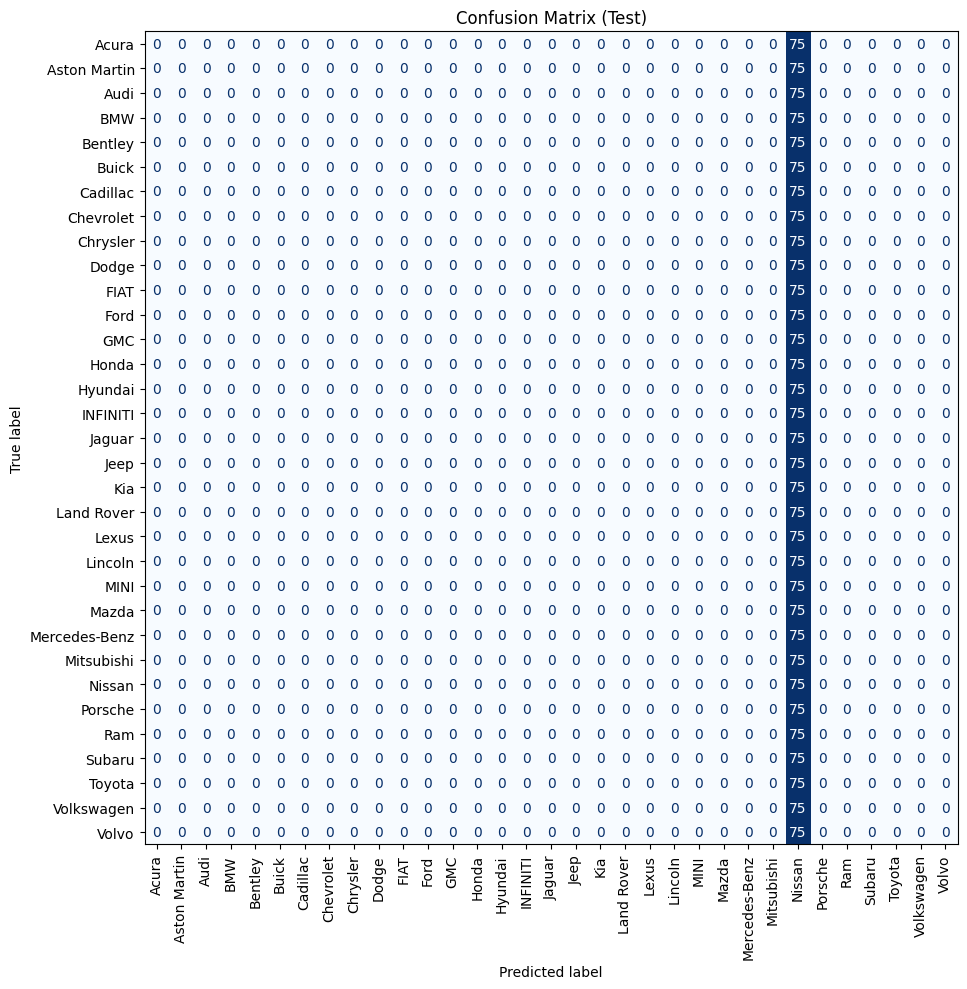

In [27]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

model.eval()
y_true, y_pred = [], []
with torch.no_grad():
    for x,y in test_loader:
        x = x.to(DEVICE)
        logits = model(x)
        y_pred += logits.argmax(1).cpu().tolist()
        y_true += y.tolist()

print(classification_report(y_true, y_pred, target_names=train_ds.classes, digits=3))

cm = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots(figsize=(10,10))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=train_ds.classes)
disp.plot(ax=ax, xticks_rotation=90, cmap="Blues", colorbar=False)
ax.set_title("Confusion Matrix (Test)")
plt.tight_layout(); plt.show()

#### Grad-CAM (Correct vs Misclassified grids)

Grad-CAM: correct=75 | wrong=2400


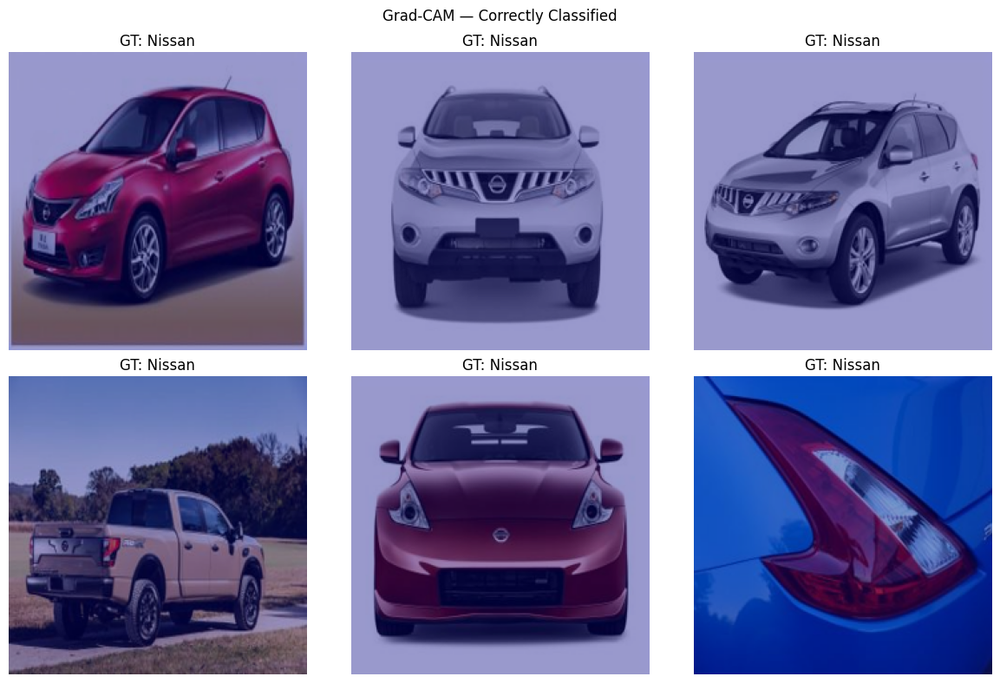

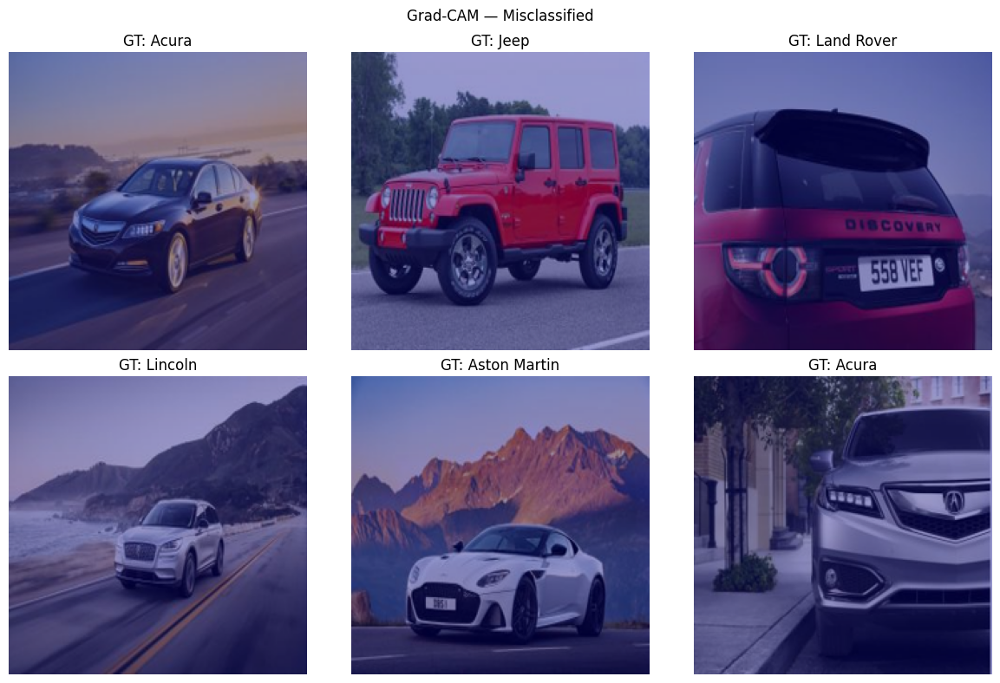

In [28]:
# Grad-CAM utilities (model-agnostic; uses the last Conv2d)
import cv2
from PIL import Image

def find_last_conv(m: nn.Module):
    last = None
    for name, layer in m.named_modules():
        if isinstance(layer, nn.Conv2d):
            last = layer
    return last

_acts, _grads = None, None
def _fwd_hook(m, i, o):
    global _acts; _acts = o
def _bwd_hook(m, gi, go):
    global _grads; _grads = go[0]

last_conv = find_last_conv(model)
_ = last_conv.register_forward_hook(_fwd_hook)
_ = last_conv.register_full_backward_hook(_bwd_hook)

def gradcam_on_pil(img_pil, img_size=IMG_SIZE):
    model.eval()
    x = eval_tfms(img_pil).unsqueeze(0).to(DEVICE)
    logits = model(x)
    cls = logits.argmax(1)
    model.zero_grad(set_to_none=True)
    one_hot = torch.zeros_like(logits); one_hot[0, cls] = 1.0
    (logits*one_hot).sum().backward(retain_graph=True)

    w = _grads.mean(dim=(2,3), keepdim=True)
    cam = (w * _acts).sum(dim=1, keepdim=True)
    cam = F.relu(cam); cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-6)
    cam = cam[0,0].detach().cpu().numpy()

    base = np.array(img_pil.resize((img_size, img_size)))[:,:,::-1]
    heat = (cam*255).astype(np.uint8)
    heat = cv2.applyColorMap(cv2.resize(heat,(img_size,img_size)), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(base, 0.6, heat, 0.4, 0)[:,:,::-1]
    return overlay

@torch.no_grad()
def collect_correct_wrong(ds, max_collect=2500):
    correct, wrong = [], []
    step = max(1, len(ds)//max_collect)
    for idx in range(0, len(ds), step):
        p, y = ds.samples[idx]
        x = eval_tfms(Image.open(p).convert("RGB")).unsqueeze(0).to(DEVICE)
        pred = model(x).argmax(1).item()
        (correct if pred==y else wrong).append(idx)
    return correct, wrong

correct_idx, wrong_idx = collect_correct_wrong(test_ds, max_collect=2500)
print(f"Grad-CAM: correct={len(correct_idx)} | wrong={len(wrong_idx)}")

def show_gradcam_grid(idx_list, title, n=6):
    n = min(n, len(idx_list))
    if n == 0:
        print(f"No samples to show for {title}"); return
    sel = np.random.choice(idx_list, size=n, replace=False)
    r = int(np.ceil(n/3)); c = 3
    fig, axs = plt.subplots(r, c, figsize=(12, 4*r)); axs = np.array(axs).reshape(-1)
    for ax, idx in zip(axs, sel):
        p,y = test_ds.samples[idx]
        img = Image.open(p).convert("RGB")
        vis = gradcam_on_pil(img)
        ax.imshow(vis); ax.set_title(f"GT: {test_ds.classes[y]}"); ax.axis("off")
    for ax in axs[len(sel):]: ax.axis("off")
    plt.suptitle(title); plt.tight_layout(); plt.show()

show_gradcam_grid(correct_idx, "Grad-CAM — Correctly Classified", n=6)
show_gradcam_grid(wrong_idx,   "Grad-CAM — Misclassified",       n=6)